In [1]:
import pandas as pd
import numpy as np
import random
import itertools
import copy

import seaborn as sns
import matplotlib.pyplot as plt

from os import listdir
from os.path import isfile, join

from sklearn.impute import SimpleImputer

from sklearn.preprocessing import *

from sklearn.model_selection import train_test_split

from sklearn.datasets import make_classification

from sklearn.metrics import mean_squared_error
from sklearn.metrics import confusion_matrix

from sklearn.linear_model import (LinearRegression,LogisticRegression, TheilSenRegressor, RANSACRegressor, HuberRegressor, Ridge)

from sklearn.pipeline import make_pipeline, Pipeline

from sklearn.svm import SVC

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier

# import warnings
# from sklearn.exceptions import DataConversionWarning
# warnings.filterwarnings(action='ignore', category=DataConversionWarning)

import random
from sklearn.impute import KNNImputer

In [2]:
pd.options.display.max_columns = 120

In [3]:
files = [f for f in listdir("data") if isfile(join("data", f))]

In [4]:
ext = "s_d_t_"
dataframes_sdt = []
dataframes_sd = []
for filename in files:
    if filename.startswith(ext):
        df = pd.read_csv("data/" + filename, index_col=None, header=0, encoding='latin1')
        df.columns = ['Kod stacji', 'Nazwa stacji', 'Rok', 'Miesiac', 'Dzien', 'Średnie dobowe zachmurzenie ogólne [oktanty]', 'Status pomiaru NOS ', 'Średnia dobowa prędkość wiatru [m/s]', 'Status pomiaru FWS ', 
                      'Średnia dobowa temperatura [°C]', 'Status pomiaru TEMP', 'Średnia dobowe ciśnienie pary wodnej [hPa]', 'Status pomiaru CPW', 'Średnia dobowa wilgotność względna [%]', 'Status pomiaru WLGS',
                      'Średnia dobowe ciśnienie na poziomie stacji [hPa]', 'Status pomiaru PPPS ', 'Średnie dobowe ciśnienie na pozimie morza [hPa]', 'Status pomiaru PPPM', 'Suma opadu dzień  [mm]', 'Status pomiaru WODZ', 
                      'Suma opadu noc   [mm] ','Status pomiaru WONO']
        dataframes_sdt.append(df)
        
    else:
        df = pd.read_csv("data/" + filename, index_col=None, header=0, encoding='latin1')
        df.columns = ['Kod stacji', 'Nazwa stacji', 'Rok', 'Miesiac', 'Dzien', 'Maksymalna temperatura dobowa [°C]', 'Status pomiaru TMAX', 'Minimalna temperatura dobowa [°C]', 'Status pomiaru TMIN', 
                      'Średnia temperatura dobowa [°C]', 'Status pomiaru STD ', 'Temperatura minimalna przy gruncie [°C] ', 'Status pomiaru TMNG  ', 'Suma dobowa opadu [mm]', 'Status pomiaru SMDB',
                      'Rodzaj opadu [S/W/ ] ', 'Wysokość pokrywy śnieżnej [cm] ', 'Status pomiaru PKSN ', 'Równoważnik wodny śniegu  [mm/cm]', 'Status pomiaru RWSN ', 'Usłonecznienie [godziny]', 
                      'Status pomiaru USL','Czas trwania opadu deszczu [godziny]', 'Status pomiaru DESZ', 'Czas trwania opadu śniegu [godziny]', 'Status pomiaru SNEG', 'Czas trwania opadu deszczu ze śniegiem [godziny]'
                      , 'Status pomiaru DISN  ', 'Czas trwania gradu [godziny] ', 'Status pomiaru GRAD', 'Czas trwania mgły [godziny]', 'Status pomiaru MGLA', 'Czas trwania zamglenia  [godziny]', 'Status pomiaru ZMGL',
                      'Czas trwania sadzi [godziny]', 'Status pomiaru SADZ', 'Czas trwania gołoledzi [godziny]', 'Status pomiaru GOLO ', 'Czas trwania zamieci śnieżnej niskiej [godziny]', 'Status pomiaru ZMNI', 'Czas trwania zamieci śnieżnej wysokiej [godziny]',
                      'Status pomiaru ZMWS', 'Czas trwania zmętnienia [godziny]', 'Status pomiaru ZMET', 'Czas trwania wiatru >=10m/s [godziny] ', 'Status pomiaru FF10', 'Czas trwania wiatru >15m/s [godziny]', 'Status pomiaru FF15'
                      , 'Czas trwania burzy  [godziny]', 'Status pomiaru BRZA ', 'Czas trwania rosy  [godziny]', 'Status pomiaru ROSA'
                     , 'Czas trwania szronu [godziny]', 'Status pomiaru SZRO', 'Wystąpienie pokrywy śnieżnej  [0/1]', 'Status pomiaru DZPS', 'Wystąpienie błyskawicy  [0/1]', 'Status pomiaru DZBL ', 'Stan gruntu [Z/R]',
                      'Izoterma dolna  [cm] ', 'Status pomiaru IZD', 'Izoterma górna [cm] ', 'Status pomiaru IZG ', 'Aktynometria  [J/cm2]', 'Status pomiaru AKTN ']
        dataframes_sd.append(df)
    

In [5]:
dataframe_sdt, dataframe_sd = pd.concat(dataframes_sdt).reset_index(drop=True),\
                              pd.concat(dataframes_sd).reset_index(drop=True)

In [6]:
set(dataframe_sdt['Rok'])

{2013, 2014, 2015, 2016, 2017, 2018, 2019}

In [7]:
dataframe_sdt['data_pomiaru'] = pd.to_datetime(dataframe_sdt.Rok*10000+dataframe_sdt.Miesiac*100\
                                      +dataframe_sdt.Dzien,format='%Y%m%d')
dataframe_sd['data_pomiaru'] = pd.to_datetime(dataframe_sd.Rok*10000+dataframe_sd.Miesiac*100\
                                      +dataframe_sd.Dzien,format='%Y%m%d')


In [8]:
dataframe_sdt.drop(columns=['Rok', 'Miesiac', 'Dzien'], inplace=True)
dataframe_sd.drop(columns=['Rok', 'Miesiac', 'Dzien'], inplace=True)

In [9]:
dataframe_sdt.sort_values(by=['data_pomiaru', 'Nazwa stacji', 'Kod stacji'], inplace=True)
dataframe_sd.sort_values(by=['data_pomiaru', 'Nazwa stacji', 'Kod stacji'], inplace=True)

In [10]:
dataframe_sd.reset_index(inplace = True, drop=True)
dataframe_sdt.reset_index(inplace = True, drop=True)

In [11]:
dataframe_sd = dataframe_sd[dataframe_sd.columns.difference(dataframe_sdt.columns)]

In [12]:
dataframe = pd.concat([dataframe_sdt, dataframe_sd], axis=1, join='outer', copy=True)

In [13]:
dataframe['Średnia temperatura dobowa [°C]']

0       3.2
1       3.2
2       4.2
3       4.7
4       4.1
       ... 
5093    1.8
5094    1.4
5095    3.7
5096    4.0
5097    6.2
Name: Średnia temperatura dobowa [°C], Length: 5098, dtype: float64

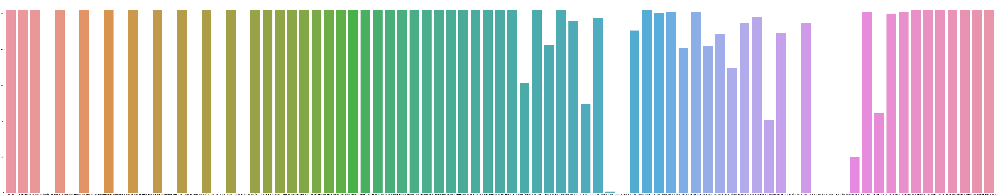

In [14]:
fig, ax = plt.subplots(figsize=(150,30))
fig.patch.set_facecolor('xkcd:white')
sns.barplot(dataframe.columns, dataframe.count())

In [15]:
dataframe.head()

,Kod stacji,Nazwa stacji,Średnie dobowe zachmurzenie ogólne [oktanty],Status pomiaru NOS,Średnia dobowa prędkość wiatru [m/s],Status pomiaru FWS,Średnia dobowa temperatura [°C],Status pomiaru TEMP,Średnia dobowe ciśnienie pary wodnej [hPa],Status pomiaru CPW,Średnia dobowa wilgotność względna [%],Status pomiaru WLGS,Średnia dobowe ciśnienie na poziomie stacji [hPa],Status pomiaru PPPS,Średnie dobowe ciśnienie na pozimie morza [hPa],Status pomiaru PPPM,Suma opadu dzień [mm],Status pomiaru WODZ,Suma opadu noc [mm],Status pomiaru WONO,data_pomiaru,Aktynometria [J/cm2],Czas trwania burzy [godziny],Czas trwania gołoledzi [godziny],Czas trwania gradu [godziny],Czas trwania mgły [godziny],Czas trwania opadu deszczu [godziny],Czas trwania opadu deszczu ze śniegiem [godziny],Czas trwania opadu śniegu [godziny],Czas trwania rosy [godziny],Czas trwania sadzi [godziny],Czas trwania szronu [godziny],Czas trwania wiatru >15m/s [godziny],Czas trwania wiatru >=10m/s [godziny],Czas trwania zamglenia [godziny],Czas trwania zamieci śnieżnej niskiej [godziny],Czas trwania zamieci śnieżnej wysokiej [godziny],Czas trwania zmętnienia [godziny],Izoterma dolna [cm],Izoterma górna [cm],Maksymalna temperatura dobowa [°C],Minimalna temperatura dobowa [°C],Rodzaj opadu [S/W/ ],Równoważnik wodny śniegu [mm/cm],Stan gruntu [Z/R],Status pomiaru AKTN,Status pomiaru BRZA,Status pomiaru DESZ,Status pomiaru DISN,Status pomiaru DZBL,Status pomiaru DZPS,Status pomiaru FF10,Status pomiaru FF15,Status pomiaru GOLO,Status pomiaru GRAD,Status pomiaru IZD,Status pomiaru IZG,Status pomiaru MGLA,Status pomiaru PKSN,Status pomiaru ROSA,Status pomiaru RWSN,Status pomiaru SADZ,Status pomiaru SMDB,Status pomiaru SNEG,Status pomiaru STD,Status pomiaru SZRO,Status pomiaru TMAX,Status pomiaru TMIN,Status pomiaru TMNG,Status pomiaru USL,Status pomiaru ZMET,Status pomiaru ZMGL,Status pomiaru ZMNI,Status pomiaru ZMWS,Suma dobowa opadu [mm],Temperatura minimalna przy gruncie [°C],Usłonecznienie [godziny],Wysokość pokrywy śnieżnej [cm],Wystąpienie błyskawicy [0/1],Wystąpienie pokrywy śnieżnej [0/1],Średnia temperatura dobowa [°C]
0,354190160,ELBL¥G-MILEJEWO,7.4,NaN,3.0,NaN,3.2,NaN,7.0,NaN,91.1,NaN,1007.1,NaN,1012.4,NaN,0.6,NaN,0.0,NaN,2013-01-02,0,0.0,0.0,0.0,0.0,9.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.2,0.0,0.0,0.0,0,0,4.6,2.8,W,0.0,NaN,8,9.0,NaN,9.0,NaN,NaN,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,NaN,9.0,NaN,9.0,NaN,NaN,NaN,NaN,9.0,NaN,9.0,9.0,0.6,2.3,0.6,0,0,0,3.2
1,354180155,GDAÑSK-WIBNO,7.4,NaN,3.8,NaN,3.2,NaN,7.6,NaN,98.6,NaN,1010.8,NaN,1011.9,NaN,0.1,NaN,0.1,NaN,2013-01-02,0,0.0,0.0,0.0,0.0,5.7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.9,0.0,0.0,0.0,20,9,5.1,2.1,W,0.0,NaN,8,9.0,NaN,9.0,NaN,NaN,9.0,9.0,9.0,9.0,NaN,NaN,9.0,9.0,9.0,9.0,9.0,NaN,9.0,NaN,9.0,NaN,NaN,NaN,NaN,9.0,NaN,9.0,9.0,0.2,0.3,1.3,0,0,0,3.2
2,354190160,ELBL¥G-MILEJEWO,7.4,NaN,4.5,NaN,4.2,NaN,7.4,NaN,90.0,NaN,1008.3,NaN,1013.7,NaN,2.8,NaN,1.6,NaN,2013-01-03,0,0.0,0.0,0.0,0.0,11.7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.9,0.0,0.0,0.0,0,0,7.3,2.2,W,0.0,NaN,8,9.0,NaN,9.0,NaN,NaN,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,NaN,9.0,NaN,9.0,NaN,NaN,NaN,9.0,9.0,NaN,9.0,9.0,4.4,1.7,0.0,0,0,0,4.2
3,354180155,GDAÑSK-WIBNO,7.3,NaN,6.1,NaN,4.7,NaN,8.3,NaN,97.5,NaN,1011.8,NaN,1012.9,NaN,0.4,NaN,0.8,NaN,2013-01-03,0,0.0,0.0,0.0,0.0,5.8,0.0,0.0,0.0,0.0,0.0,0.0,2.3,2.3,0.0,0.0,0.0,20,1,8.4,1.6,W,0.0,NaN,8,9.0,NaN,9.0,NaN,NaN,NaN,9.0,9.0,9.0,NaN,NaN,9.0,9.0,9.0,9.0,9.0,NaN,9.0,NaN,9.0,NaN,NaN,NaN,9.0,9.0,NaN,9.0,9.0,1.2,-0.1,0.0,0,0,0,4.7
4,354190160,ELBL¥G-MILEJEWO,4.3,NaN,3.3,NaN,4.1,NaN,7.0,NaN,85.5,NaN,1009.7,NaN,1015.1,NaN,0.0,NaN,0.3,NaN,2013-01-04,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.7,0.0,0.0,0.0,0,0,7.1,3.0,W,0.0,NaN,8,9.0,9.0,9.0,NaN,NaN,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,NaN,9.0,NaN,9.0,NaN,NaN,NaN,NaN,9.0,NaN,9.0,9.0,0.3,1.2,4.6,0,0,0,4.1


### Z otrzymanych wykresów można stwiedzić, że w niektórych wykresach jest duży brak znaczeń dlatego trzeba sprawdzić obecność rekordów w podanych kolumnach dla pozostalych dataframów.

### Odrzucamy wszystkie kolumny które mają mniej niż 70 procent zapisów za wszystkie badane lata.

In [16]:
dataframe.dropna(thresh = len(dataframe)*0.7, axis = 1, inplace = True)

In [17]:
dataframe.head()

,Kod stacji,Nazwa stacji,Średnie dobowe zachmurzenie ogólne [oktanty],Średnia dobowa prędkość wiatru [m/s],Średnia dobowa temperatura [°C],Średnia dobowe ciśnienie pary wodnej [hPa],Średnia dobowa wilgotność względna [%],Średnia dobowe ciśnienie na poziomie stacji [hPa],Średnie dobowe ciśnienie na pozimie morza [hPa],Suma opadu dzień [mm],Suma opadu noc [mm],data_pomiaru,Aktynometria [J/cm2],Czas trwania burzy [godziny],Czas trwania gołoledzi [godziny],Czas trwania gradu [godziny],Czas trwania mgły [godziny],Czas trwania opadu deszczu [godziny],Czas trwania opadu deszczu ze śniegiem [godziny],Czas trwania opadu śniegu [godziny],Czas trwania rosy [godziny],Czas trwania sadzi [godziny],Czas trwania szronu [godziny],Czas trwania wiatru >15m/s [godziny],Czas trwania wiatru >=10m/s [godziny],Czas trwania zamglenia [godziny],Czas trwania zamieci śnieżnej niskiej [godziny],Czas trwania zamieci śnieżnej wysokiej [godziny],Czas trwania zmętnienia [godziny],Izoterma dolna [cm],Izoterma górna [cm],Maksymalna temperatura dobowa [°C],Minimalna temperatura dobowa [°C],Równoważnik wodny śniegu [mm/cm],Stan gruntu [Z/R],Status pomiaru AKTN,Status pomiaru BRZA,Status pomiaru DISN,Status pomiaru FF10,Status pomiaru FF15,Status pomiaru GOLO,Status pomiaru GRAD,Status pomiaru IZD,Status pomiaru IZG,Status pomiaru MGLA,Status pomiaru PKSN,Status pomiaru RWSN,Status pomiaru SADZ,Status pomiaru SNEG,Status pomiaru SZRO,Status pomiaru ZMET,Status pomiaru ZMNI,Status pomiaru ZMWS,Suma dobowa opadu [mm],Temperatura minimalna przy gruncie [°C],Usłonecznienie [godziny],Wysokość pokrywy śnieżnej [cm],Wystąpienie błyskawicy [0/1],Wystąpienie pokrywy śnieżnej [0/1],Średnia temperatura dobowa [°C]
0,354190160,ELBL¥G-MILEJEWO,7.4,3.0,3.2,7.0,91.1,1007.1,1012.4,0.6,0.0,2013-01-02,0,0.0,0.0,0.0,0.0,9.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.2,0.0,0.0,0.0,0,0,4.6,2.8,0.0,NaN,8,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,0.6,2.3,0.6,0,0,0,3.2
1,354180155,GDAÑSK-WIBNO,7.4,3.8,3.2,7.6,98.6,1010.8,1011.9,0.1,0.1,2013-01-02,0,0.0,0.0,0.0,0.0,5.7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.9,0.0,0.0,0.0,20,9,5.1,2.1,0.0,NaN,8,9.0,9.0,9.0,9.0,9.0,9.0,NaN,NaN,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,0.2,0.3,1.3,0,0,0,3.2
2,354190160,ELBL¥G-MILEJEWO,7.4,4.5,4.2,7.4,90.0,1008.3,1013.7,2.8,1.6,2013-01-03,0,0.0,0.0,0.0,0.0,11.7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.9,0.0,0.0,0.0,0,0,7.3,2.2,0.0,NaN,8,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,4.4,1.7,0.0,0,0,0,4.2
3,354180155,GDAÑSK-WIBNO,7.3,6.1,4.7,8.3,97.5,1011.8,1012.9,0.4,0.8,2013-01-03,0,0.0,0.0,0.0,0.0,5.8,0.0,0.0,0.0,0.0,0.0,0.0,2.3,2.3,0.0,0.0,0.0,20,1,8.4,1.6,0.0,NaN,8,9.0,9.0,NaN,9.0,9.0,9.0,NaN,NaN,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,1.2,-0.1,0.0,0,0,0,4.7
4,354190160,ELBL¥G-MILEJEWO,4.3,3.3,4.1,7.0,85.5,1009.7,1015.1,0.0,0.3,2013-01-04,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.7,0.0,0.0,0.0,0,0,7.1,3.0,0.0,NaN,8,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,0.3,1.2,4.6,0,0,0,4.1


In [18]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5098 entries, 0 to 5097
Data columns (total 60 columns):
 #   Column                                             Non-Null Count  Dtype         
---  ------                                             --------------  -----         
 0   Kod stacji                                         5098 non-null   int64         
 1   Nazwa stacji                                       5098 non-null   object        
 2   Średnie dobowe zachmurzenie ogólne [oktanty]       5098 non-null   float64       
 3   Średnia dobowa prędkość wiatru [m/s]               5098 non-null   float64       
 4   Średnia dobowa temperatura [°C]                    5098 non-null   float64       
 5   Średnia dobowe ciśnienie pary wodnej [hPa]         5098 non-null   float64       
 6   Średnia dobowa wilgotność względna [%]             5098 non-null   float64       
 7   Średnia dobowe ciśnienie na poziomie stacji [hPa]  5098 non-null   float64       
 8   Średnie dobowe ciś

### Usuwamy nazwy column i nazwy stacji pomiarowych które duplikują sie i nie maja wpływu na wyliczenia.

In [19]:
dataframe.drop(columns = ["Nazwa stacji", "Kod stacji", "Stan gruntu [Z/R]"], inplace = True)

### To samo dla kolumn które mają w nazwie Status ponieważ zawierają dane czy był pomiar otrzymany.

In [20]:
columns_filtered = [col for col in dataframe if col.lower()[:6] != 'status']

In [21]:
dataframe = dataframe[columns_filtered]

In [22]:
imputer = KNNImputer(n_neighbors=2, weights="uniform")
df_imputed = pd.DataFrame(imputer.fit_transform(dataframe.select_dtypes(include=['float64'])))
df_imputed.columns=dataframe.select_dtypes(include=['float64']).columns
dataframe.drop(columns=dataframe.select_dtypes(include=['float64']).columns, inplace = True)

In [23]:
dataframe = pd.concat([dataframe, df_imputed], axis=1)

### Wykres dla znalezienia największych korelacji pomiędzy kolumnami.

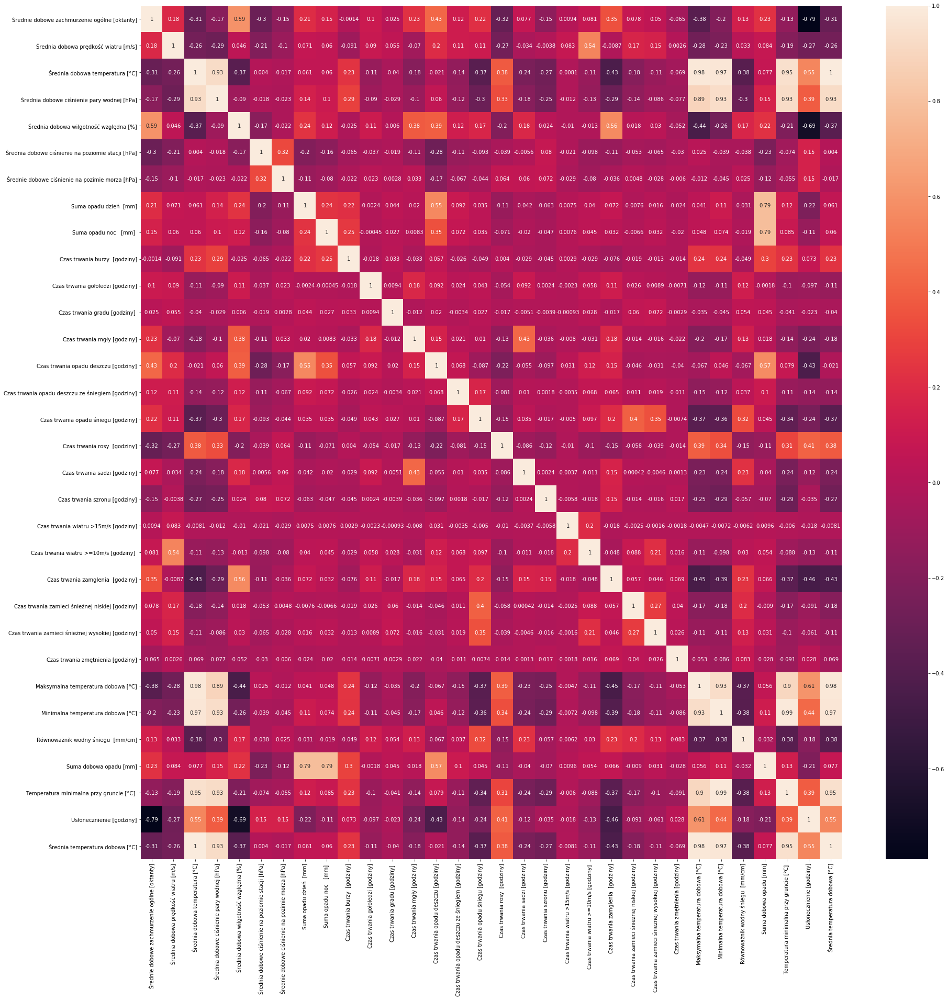

In [24]:
fig, ax = plt.subplots(figsize=(30,30)) 
fig.patch.set_facecolor('xkcd:white')
sns.heatmap(dataframe.select_dtypes(include=['float64']).corr(), annot=True, ax=ax)

### Kolumny które mają pozytywna kowariancję zmieniają się w jednym kierunku.

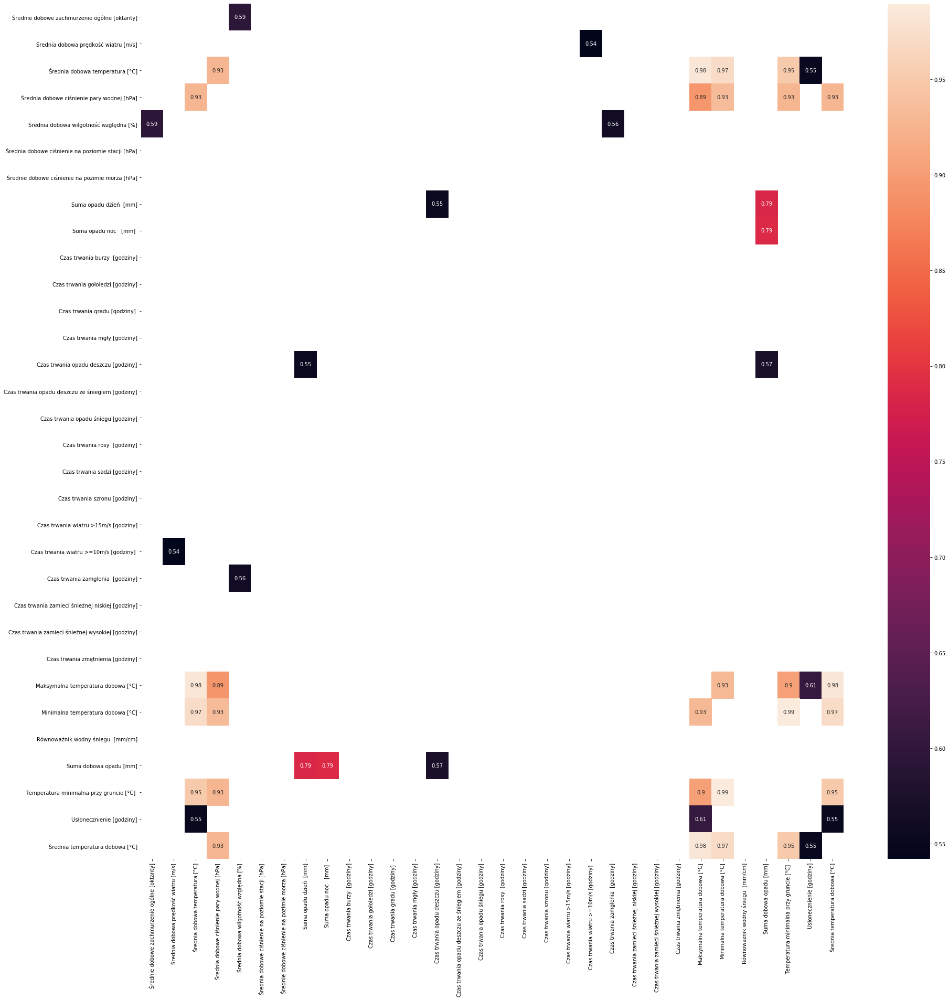

In [25]:
fig, ax = plt.subplots(figsize=(30,30))
fig.patch.set_facecolor('xkcd:white')
sns.heatmap(dataframe.select_dtypes(include=['float64']).corr()[(dataframe.select_dtypes(include=['float64']).corr() >= 0.5) &\
                                                             (dataframe.select_dtypes(include=['float64']).corr() < 1)],\
            annot=True, ax=ax)

### Jak można odczytać z macierzy korelacji: korelują pomiedzy sobą kolumny z jednego zakresu np.Temperatura, Suma Opadów itd. Korelacja pomiedzy wartościami z różnych kategorji jest średnia nawet pomiędzy nasłonecznieniem a temperaturą. W przypadku negatywnej korelacji to ona występuje dla kategorii które są "oczywiste", na przykład: nasłonecznienie i zachmurzenie a także pokazuje zależność zachmurzenia od wysokości ciśnienia.

In [26]:
dataframe.reset_index(drop=True, inplace=True)

In [27]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5098 entries, 0 to 5097
Data columns (total 39 columns):
 #   Column                                             Non-Null Count  Dtype         
---  ------                                             --------------  -----         
 0   data_pomiaru                                       5098 non-null   datetime64[ns]
 1   Aktynometria  [J/cm2]                              5098 non-null   int64         
 2   Izoterma dolna  [cm]                               5098 non-null   int64         
 3   Izoterma górna [cm]                                5098 non-null   int64         
 4   Wysokość pokrywy śnieżnej [cm]                     5098 non-null   int64         
 5   Wystąpienie błyskawicy  [0/1]                      5098 non-null   int64         
 6   Wystąpienie pokrywy śnieżnej  [0/1]                5098 non-null   int64         
 7   Średnie dobowe zachmurzenie ogólne [oktanty]       5098 non-null   float64       
 8   Średnia dobowa prę

In [28]:
dataframe.describe()

,Aktynometria [J/cm2],Izoterma dolna [cm],Izoterma górna [cm],Wysokość pokrywy śnieżnej [cm],Wystąpienie błyskawicy [0/1],Wystąpienie pokrywy śnieżnej [0/1],Średnie dobowe zachmurzenie ogólne [oktanty],Średnia dobowa prędkość wiatru [m/s],Średnia dobowa temperatura [°C],Średnia dobowe ciśnienie pary wodnej [hPa],Średnia dobowa wilgotność względna [%],Średnia dobowe ciśnienie na poziomie stacji [hPa],Średnie dobowe ciśnienie na pozimie morza [hPa],Suma opadu dzień [mm],Suma opadu noc [mm],Czas trwania burzy [godziny],Czas trwania gołoledzi [godziny],Czas trwania gradu [godziny],Czas trwania mgły [godziny],Czas trwania opadu deszczu [godziny],Czas trwania opadu deszczu ze śniegiem [godziny],Czas trwania opadu śniegu [godziny],Czas trwania rosy [godziny],Czas trwania sadzi [godziny],Czas trwania szronu [godziny],Czas trwania wiatru >15m/s [godziny],Czas trwania wiatru >=10m/s [godziny],Czas trwania zamglenia [godziny],Czas trwania zamieci śnieżnej niskiej [godziny],Czas trwania zamieci śnieżnej wysokiej [godziny],Czas trwania zmętnienia [godziny],Maksymalna temperatura dobowa [°C],Minimalna temperatura dobowa [°C],Równoważnik wodny śniegu [mm/cm],Suma dobowa opadu [mm],Temperatura minimalna przy gruncie [°C],Usłonecznienie [godziny],Średnia temperatura dobowa [°C]
count,5098.0,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.00000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000
mean,0.0,3.180267,0.087289,0.847783,0.004512,0.117693,5.316065,4.097646,8.850059,9.847097,80.298823,1003.868949,1015.187387,0.892291,0.829835,0.089388,0.06632,0.002589,0.982758,1.979796,0.058788,0.635347,2.141330,0.316987,0.524402,0.000432,0.322264,5.151942,0.119694,0.046587,0.035877,12.382601,5.756277,0.119949,1.722793,4.556807,5.464339,8.850059
std,0.0,8.787100,0.917871,3.054212,0.067023,0.322276,2.022688,1.539117,7.754901,4.472411,11.636467,13.713862,16.796928,2.743678,2.755386,0.470844,0.69565,0.067591,2.961857,3.364183,0.403023,2.432171,3.784332,2.070474,2.196508,0.017823,1.593447,6.959412,1.166160,0.684075,0.478584,8.823549,7.147236,0.467966,4.324551,7.218335,4.855301,7.754901
min,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-15.800000,0.000000,0.000000,953.500000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-13.300000,-18.900000,0.000000,0.000000,-22.300000,0.000000,-15.800000
25%,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,3.000000,2.900000,6.300000,72.800000,993.300000,1010.100000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.325000,0.500000,0.000000,0.000000,-0.400000,0.400000,2.900000
50%,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,5.800000,3.900000,8.600000,9.000000,81.600000,1004.100000,1015.600000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.700000,0.000000,0.000000,0.000000,12.100000,5.600000,0.000000,0.000000,4.300000,5.000000,8.600000
75%,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,6.900000,5.000000,15.400000,13.100000,89.400000,1014.700000,1021.000000,0.300000,0.200000,0.000000,0.00000,0.000000,0.000000,2.700000,0.000000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,8.500000,0.000000,0.000000,0.000000,19.600000,11.500000,0.000000,1.400000,10.300000,9.500000,15.400000
max,0.0,59.000000,19.000000,33.000000,1.000000,1.000000,8.000000,12.100000,27.600000,25.300000,100.000000,1042.000000,1043.500000,43.000000,76.500000,7.900000,18.40000,4.

### Uzupełnienie wartości pustych wg wartości dominującej dla zmniejszenia wpływu na mediane datasetu.

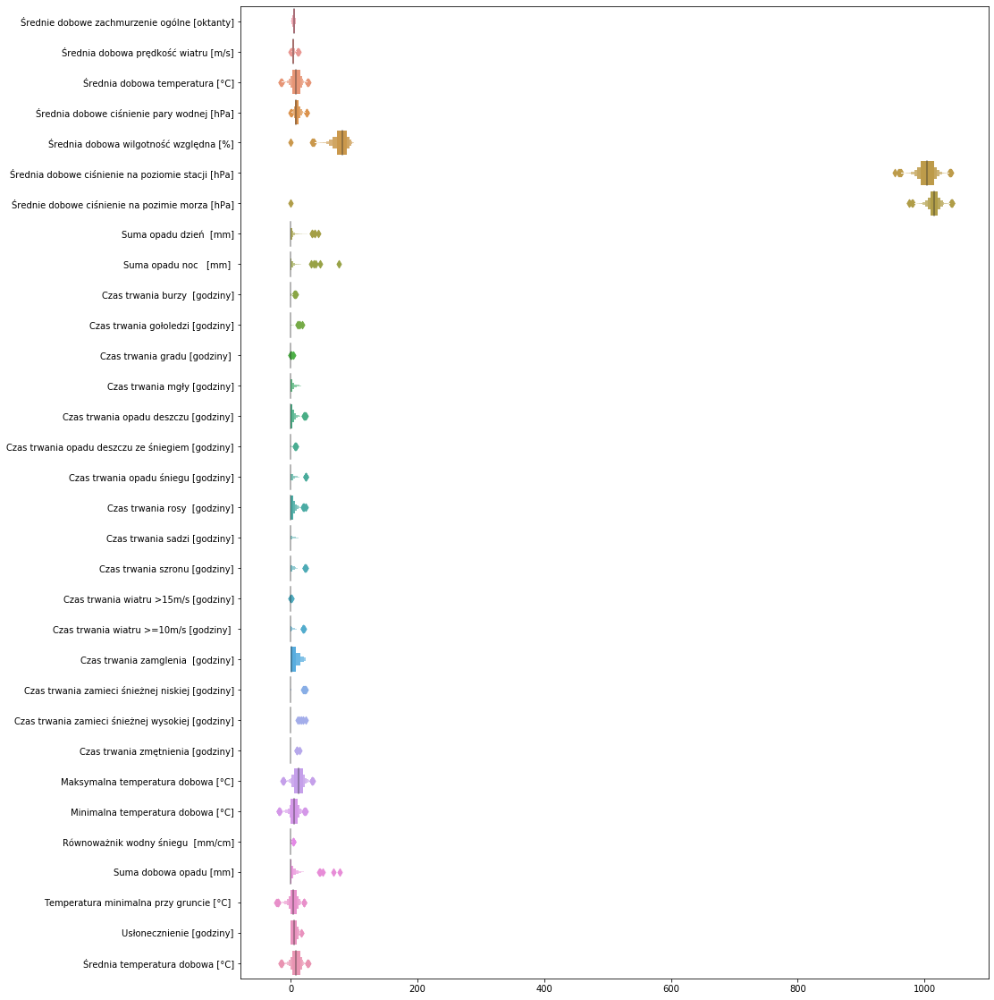

In [29]:
fig, ax = plt.subplots(figsize=(15,20))
ax = sns.boxenplot(orient="h", data=dataframe.select_dtypes(include=['float64']))

In [30]:
for column in dataframe.select_dtypes(include=['float64']).columns:
    whisker_width = 1.5
    q1 = dataframe[column].quantile(0.25)
    q3 = dataframe[column].quantile(0.75)
    iqr = q3 - q1
    top = q3 + 1.5 * iqr
    bottom = q1 - 1.5 * iqr
    dataframe[column] = np.where(dataframe[column]>top, top, dataframe[column])
    dataframe[column] = np.where(dataframe[column]<bottom, bottom, dataframe[column])

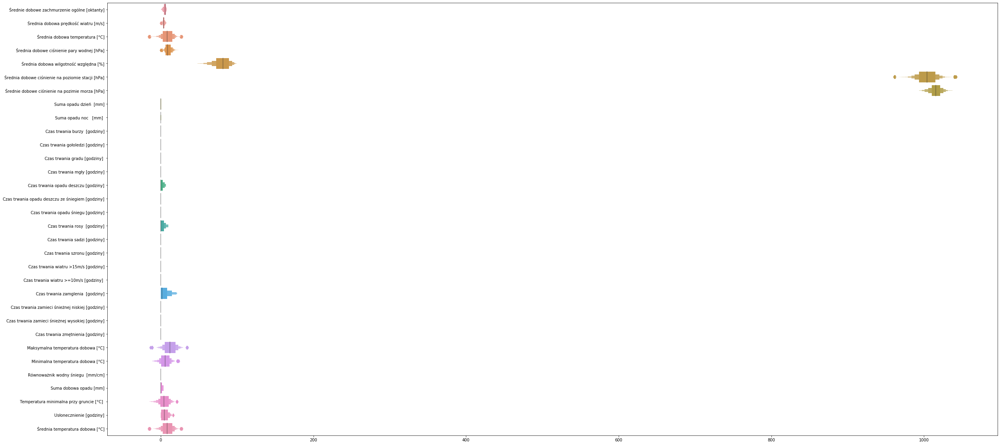

In [31]:
fig, ax = plt.subplots(figsize=(40,20))
ax = sns.boxenplot(orient="h", data=dataframe.select_dtypes(include=['float64']))

In [32]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5098 entries, 0 to 5097
Data columns (total 39 columns):
 #   Column                                             Non-Null Count  Dtype         
---  ------                                             --------------  -----         
 0   data_pomiaru                                       5098 non-null   datetime64[ns]
 1   Aktynometria  [J/cm2]                              5098 non-null   int64         
 2   Izoterma dolna  [cm]                               5098 non-null   int64         
 3   Izoterma górna [cm]                                5098 non-null   int64         
 4   Wysokość pokrywy śnieżnej [cm]                     5098 non-null   int64         
 5   Wystąpienie błyskawicy  [0/1]                      5098 non-null   int64         
 6   Wystąpienie pokrywy śnieżnej  [0/1]                5098 non-null   int64         
 7   Średnie dobowe zachmurzenie ogólne [oktanty]       5098 non-null   float64       
 8   Średnia dobowa prę

In [33]:
dataframe.describe()

,Aktynometria [J/cm2],Izoterma dolna [cm],Izoterma górna [cm],Wysokość pokrywy śnieżnej [cm],Wystąpienie błyskawicy [0/1],Wystąpienie pokrywy śnieżnej [0/1],Średnie dobowe zachmurzenie ogólne [oktanty],Średnia dobowa prędkość wiatru [m/s],Średnia dobowa temperatura [°C],Średnia dobowe ciśnienie pary wodnej [hPa],Średnia dobowa wilgotność względna [%],Średnia dobowe ciśnienie na poziomie stacji [hPa],Średnie dobowe ciśnienie na pozimie morza [hPa],Suma opadu dzień [mm],Suma opadu noc [mm],Czas trwania burzy [godziny],Czas trwania gołoledzi [godziny],Czas trwania gradu [godziny],Czas trwania mgły [godziny],Czas trwania opadu deszczu [godziny],Czas trwania opadu deszczu ze śniegiem [godziny],Czas trwania opadu śniegu [godziny],Czas trwania rosy [godziny],Czas trwania sadzi [godziny],Czas trwania szronu [godziny],Czas trwania wiatru >15m/s [godziny],Czas trwania wiatru >=10m/s [godziny],Czas trwania zamglenia [godziny],Czas trwania zamieci śnieżnej niskiej [godziny],Czas trwania zamieci śnieżnej wysokiej [godziny],Czas trwania zmętnienia [godziny],Maksymalna temperatura dobowa [°C],Minimalna temperatura dobowa [°C],Równoważnik wodny śniegu [mm/cm],Suma dobowa opadu [mm],Temperatura minimalna przy gruncie [°C],Usłonecznienie [godziny],Średnia temperatura dobowa [°C]
count,5098.0,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.0,5098.0,5098.0,5098.0,5098.000000,5098.0,5098.0,5098.000000,5098.0,5098.0,5098.0,5098.0,5098.000000,5098.0,5098.0,5098.0,5098.000000,5098.000000,5098.0,5098.000000,5098.000000,5098.000000,5098.000000
mean,0.0,3.180267,0.087289,0.847783,0.004512,0.117693,5.316065,4.078501,8.850059,9.844723,80.352923,1003.871302,1015.428178,0.187397,0.128913,0.0,0.0,0.0,0.0,1.619027,0.0,0.0,1.979855,0.0,0.0,0.0,0.0,5.047577,0.0,0.0,0.0,12.382601,5.759278,0.0,0.857905,4.567595,5.464339,8.850059
std,0.0,8.787100,0.917871,3.054212,0.067023,0.322276,2.022688,1.477661,7.754901,4.464897,11.450835,13.706033,8.715844,0.305411,0.207670,0.0,0.0,0.0,0.0,2.312003,0.0,0.0,3.316204,0.0,0.0,0.0,0.0,6.693680,0.0,0.0,0.0,8.823549,7.137737,0.0,1.314163,7.184598,4.855301,7.754901
min,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-15.800000,0.000000,47.900000,961.200000,993.750000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,-13.300000,-16.000000,0.0,0.000000,-16.450000,0.000000,-15.800000
25%,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,3.000000,2.900000,6.300000,72.800000,993.300000,1010.100000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,5.325000,0.500000,0.0,0.000000,-0.400000,0.400000,2.900000
50%,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,5.800000,3.900000,8.600000,9.000000,81.600000,1004.100000,1015.600000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.100000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,1.700000,0.0,0.0,0.0,12.100000,5.600000,0.0,0.000000,4.300000,5.000000,8.600000
75%,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,6.900000,5.000000,15.400000,13.100000,89.400000,1014.700000,1021.000000,0.300000,0.200000,0.0,0.0,0.0,0.0,2.700000,0.0,0.0,4.000000,0.0,0.0,0.0,0.0,8.500000,0.0,0.0,0.0,19.600000,11.500000,0.0,1.400000,10.300000,9.500000,15.400000
max,0.0,59.000000,19.000000,33.000000,1.000000,1.000000,8.000000,8.000000,27.600000,23.300000,100.000000,1042.000000,1037.350000,0.750000,0.500000,0.0,0.0,0.0,0.0,6.750000,0.0,0.0,10.000000,0.0,0.0,0.0,0.0,21.250000,0.0,0.0,0.0,35.100000,23.300000,0.0,3.500000,21.400000,16.200000,27.600000


In [34]:
not_to_remove = ['Czas trwania opadu deszczu [godziny]', 'Czas trwania rosy  [godziny]',\
                 'Czas trwania zamglenia  [godziny]', ]

In [35]:
filtered = [col for col in dataframe if col.lower()[:4] != 'czas']
dataframe = dataframe[filtered+not_to_remove]

In [36]:
filtered

['data_pomiaru',
 'Aktynometria  [J/cm2]',
 'Izoterma dolna  [cm] ',
 'Izoterma górna [cm] ',
 'Wysokość pokrywy śnieżnej [cm] ',
 'Wystąpienie błyskawicy  [0/1]',
 'Wystąpienie pokrywy śnieżnej  [0/1]',
 'Średnie dobowe zachmurzenie ogólne [oktanty]',
 'Średnia dobowa prędkość wiatru [m/s]',
 'Średnia dobowa temperatura [°C]',
 'Średnia dobowe ciśnienie pary wodnej [hPa]',
 'Średnia dobowa wilgotność względna [%]',
 'Średnia dobowe ciśnienie na poziomie stacji [hPa]',
 'Średnie dobowe ciśnienie na pozimie morza [hPa]',
 'Suma opadu dzień  [mm]',
 'Suma opadu noc   [mm] ',
 'Maksymalna temperatura dobowa [°C]',
 'Minimalna temperatura dobowa [°C]',
 'Równoważnik wodny śniegu  [mm/cm]',
 'Suma dobowa opadu [mm]',
 'Temperatura minimalna przy gruncie [°C] ',
 'Usłonecznienie [godziny]',
 'Średnia temperatura dobowa [°C]']

In [37]:
dataframe.drop(columns = ["Równoważnik wodny śniegu  [mm/cm]", "Wystąpienie pokrywy śnieżnej  [0/1]", "Wysokość pokrywy śnieżnej [cm] ",\
                        "Wystąpienie błyskawicy  [0/1]", "Izoterma dolna  [cm] ", "Izoterma górna [cm] ", "Aktynometria  [J/cm2]"], inplace = True)

In [38]:
dataframe.describe()

,Średnie dobowe zachmurzenie ogólne [oktanty],Średnia dobowa prędkość wiatru [m/s],Średnia dobowa temperatura [°C],Średnia dobowe ciśnienie pary wodnej [hPa],Średnia dobowa wilgotność względna [%],Średnia dobowe ciśnienie na poziomie stacji [hPa],Średnie dobowe ciśnienie na pozimie morza [hPa],Suma opadu dzień [mm],Suma opadu noc [mm],Maksymalna temperatura dobowa [°C],Minimalna temperatura dobowa [°C],Suma dobowa opadu [mm],Temperatura minimalna przy gruncie [°C],Usłonecznienie [godziny],Średnia temperatura dobowa [°C],Czas trwania opadu deszczu [godziny],Czas trwania rosy [godziny],Czas trwania zamglenia [godziny]
count,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000,5098.000000
mean,5.316065,4.078501,8.850059,9.844723,80.352923,1003.871302,1015.428178,0.187397,0.128913,12.382601,5.759278,0.857905,4.567595,5.464339,8.850059,1.619027,1.979855,5.047577
std,2.022688,1.477661,7.754901,4.464897,11.450835,13.706033,8.715844,0.305411,0.207670,8.823549,7.137737,1.314163,7.184598,4.855301,7.754901,2.312003,3.316204,6.693680
min,0.000000,0.000000,-15.800000,0.000000,47.900000,961.200000,993.750000,0.000000,0.000000,-13.300000,-16.000000,0.000000,-16.450000,0.000000,-15.800000,0.000000,0.000000,0.000000
25%,4.000000,3.000000,2.900000,6.300000,72.800000,993.300000,1010.100000,0.000000,0.000000,5.325000,0.500000,0.000000,-0.400000,0.400000,2.900000,0.000000,0.000000,0.000000
50%,5.800000,3.900000,8.600000,9.000000,81.600000,1004.100000,1015.600000,0.000000,0.000000,12.100000,5.600000,0.000000,4.300000,5.000000,8.600000,0.100000,0.000000,1.700000
75%,6.900000,5.000000,15.400000,13.100000,89.400000,1014.700000,1021.000000,0.300000,0.200000,19.600000,11.500000,1.400000,10.300000,9.500000,15.400000,2.700000,4.000000,8.500000
max,8.000000,8.000000,27.600000,23.300000,100.000000,1042.000000,1037.350000,0.750000,0.500000,35.100000,23.300000,3.500000,21.400000,16.200000,27.600000,6.750000,10.000000,21.250000


### USUWAMY:
1. Kolumny dotyczące śniegu ponieważ dotyczą tylko zimy i są raczej efektem pobocznym opadów
2. Kolumny dotyczące izotermy ponieważ są wynikiem temperatury dobowej
3. Sumę temperatur dla Dnia i Nocy ponieważ korzystamy z dobowej temperatury
4. wszystkie kolumny które mają w nazwie czas oprócc usłonecznienia ponieważ w większości swojej mają wartość 0 za rzadkimi wyjątkami
5. Wystąpienie błyskawicy, ponieważ zjawisko dość rzadke
6. Aktynometrie ponieważ większość wpisów są 0

In [39]:
dataframe

,data_pomiaru,Średnie dobowe zachmurzenie ogólne [oktanty],Średnia dobowa prędkość wiatru [m/s],Średnia dobowa temperatura [°C],Średnia dobowe ciśnienie pary wodnej [hPa],Średnia dobowa wilgotność względna [%],Średnia dobowe ciśnienie na poziomie stacji [hPa],Średnie dobowe ciśnienie na pozimie morza [hPa],Suma opadu dzień [mm],Suma opadu noc [mm],Maksymalna temperatura dobowa [°C],Minimalna temperatura dobowa [°C],Suma dobowa opadu [mm],Temperatura minimalna przy gruncie [°C],Usłonecznienie [godziny],Średnia temperatura dobowa [°C],Czas trwania opadu deszczu [godziny],Czas trwania rosy [godziny],Czas trwania zamglenia [godziny]
0,2013-01-02,7.4,3.0,3.2,7.0,91.1,1007.1,1012.4,0.60,0.0,4.6,2.8,0.6,2.3,0.6,3.2,6.75,0.0,13.2
1,2013-01-02,7.4,3.8,3.2,7.6,98.6,1010.8,1011.9,0.10,0.1,5.1,2.1,0.2,0.3,1.3,3.2,5.70,0.0,7.9
2,2013-01-03,7.4,4.5,4.2,7.4,90.0,1008.3,1013.7,0.75,0.5,7.3,2.2,3.5,1.7,0.0,4.2,6.75,0.0,6.9
3,2013-01-03,7.3,6.1,4.7,8.3,97.5,1011.8,1012.9,0.40,0.5,8.4,1.6,1.2,-0.1,0.0,4.7,5.80,0.0,2.3
4,2013-01-04,4.3,3.3,4.1,7.0,85.5,1009.7,1015.1,0.00,0.3,7.1,3.0,0.3,1.2,4.6,4.1,0.00,0.0,8.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5093,2019-12-29,6.8,3.9,1.8,5.5,78.3,1035.4,1036.5,0.00,0.0,3.5,0.6,0.0,-0.1,1.3,1.8,0.70,0.0,0.0
5094,2019-12-30,6.5,8.0,1.4,4.4,65.9,998.5,1021.8,0.00,0.5,3.1,-0.9,0.6,-0.9,0.0,1.4,2.20,0.0,0.0
5095,2019-12-30,6.1,5.1,3.7,4.7,60.0,1019.9,1021.0,0.00,0.0,5.8,0.9,0.0,0.5,0.0,3.7,1.30,0.0,0.0
5096,2019-12-31,6.9,6.4,4.0,6.3,77.6,993.4,1016.3,0.20,0.0,5.4,1.9,0.2,0.9,0.8,4.0,2.70,0.0,0.8


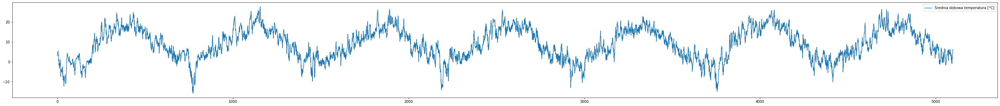

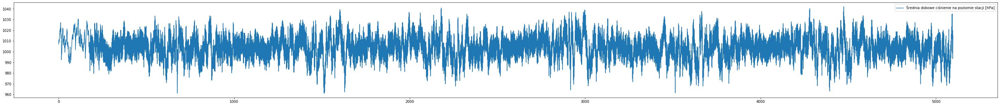

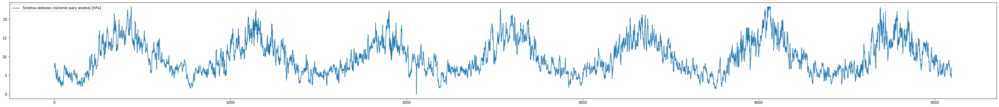

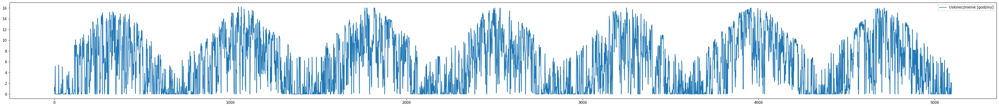

In [40]:
dataframe.plot( y = ["Średnia dobowa temperatura [°C]"], figsize=(50, 5))
dataframe.plot( y = ["Średnia dobowe ciśnienie na poziomie stacji [hPa]"], figsize=(50, 5))
dataframe.plot( y = ["Średnia dobowe ciśnienie pary wodnej [hPa]"], figsize=(50, 5))
dataframe.plot( y = ["Usłonecznienie [godziny]"], figsize=(50, 5))

### Ten wykres pokazuje że mozemy wykorzystać regresje dla uzupełnienia podanych danych ale nie potrzebujemy tego robić.

plt.figure(figsize=(15,10))
plt.tight_layout()
sns.distplot(dataset['Średnia dobowa temperatura [°C]'])

plt.figure(figsize=(15,10))
plt.tight_layout()
sns.distplot(dataset["Średnia dobowe ciśnienie na poziomie stacji [hPa]"])

### Po oczyszeniu datasetu możemy zobaczyć korelacje pomiędzy wartościami wraz z sprawdzeniem możliwości dopasowania regresji liniowej

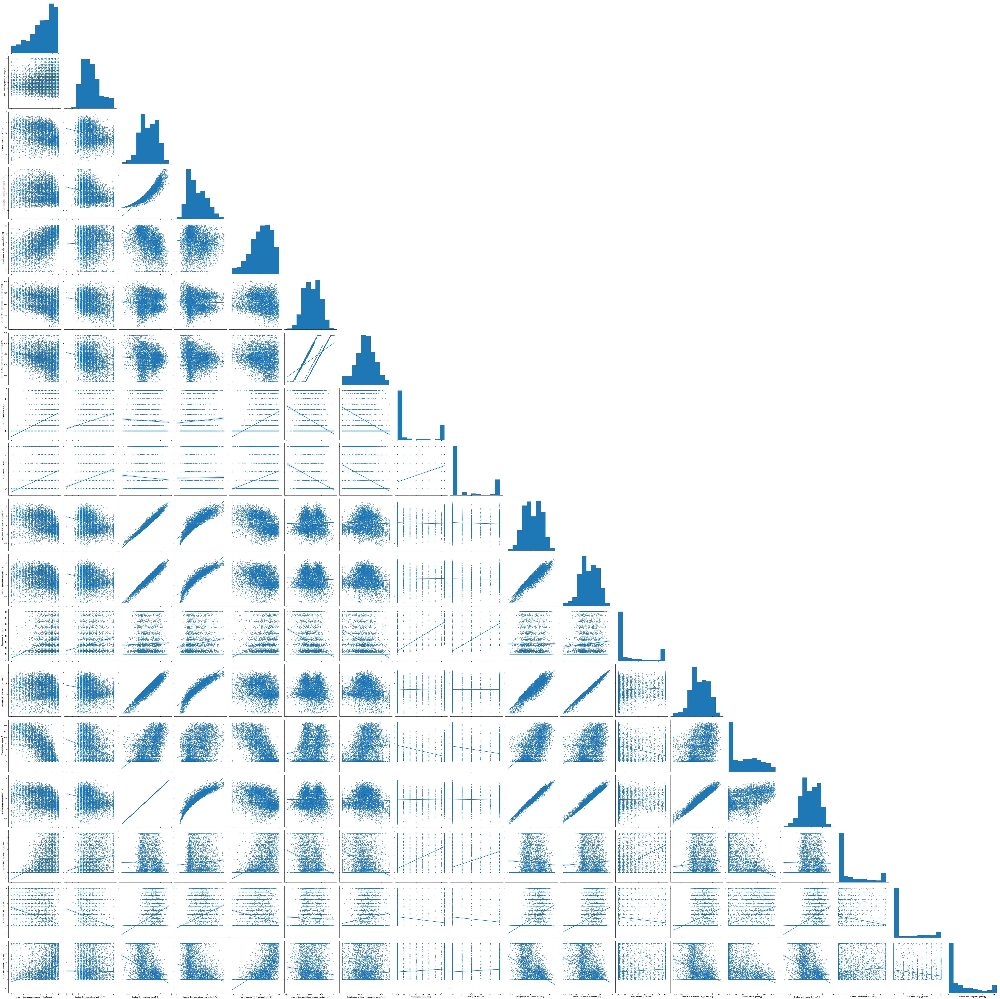

In [41]:
sns.pairplot(dataframe.select_dtypes(include=['float64']), height=5, corner=True, kind="reg", palette="husl", markers="+")

## Z danej grafiki można wysnuć takie wnioski:
1. Mamy dwie jednakowe kolumny 1 - Średnia dobowa temperatura [°C] a 2 - Średnia temperatura dobowa [°C] i jedna jest do usunięcia
2. Średnie dobowe cisnienie na poziomie morza zachowuje się tak samo jak ciśnienie na poziomie stacji tylko ma inne znaczenie, jedna z tych kolumn może być usunieta

In [42]:
day_temp_series = dataframe['Średnia dobowa temperatura [°C]']

In [43]:
dataframe.drop(columns = ['Średnia dobowa temperatura [°C]'], inplace = True)

In [44]:
dataframe.drop(columns = ['Średnie dobowe ciśnienie na pozimie morza [hPa]'], inplace = True)

### Powtórnie budujemy grafikę pairplot dla znalezienia korelacji wraz z przykładowymi regresjami.

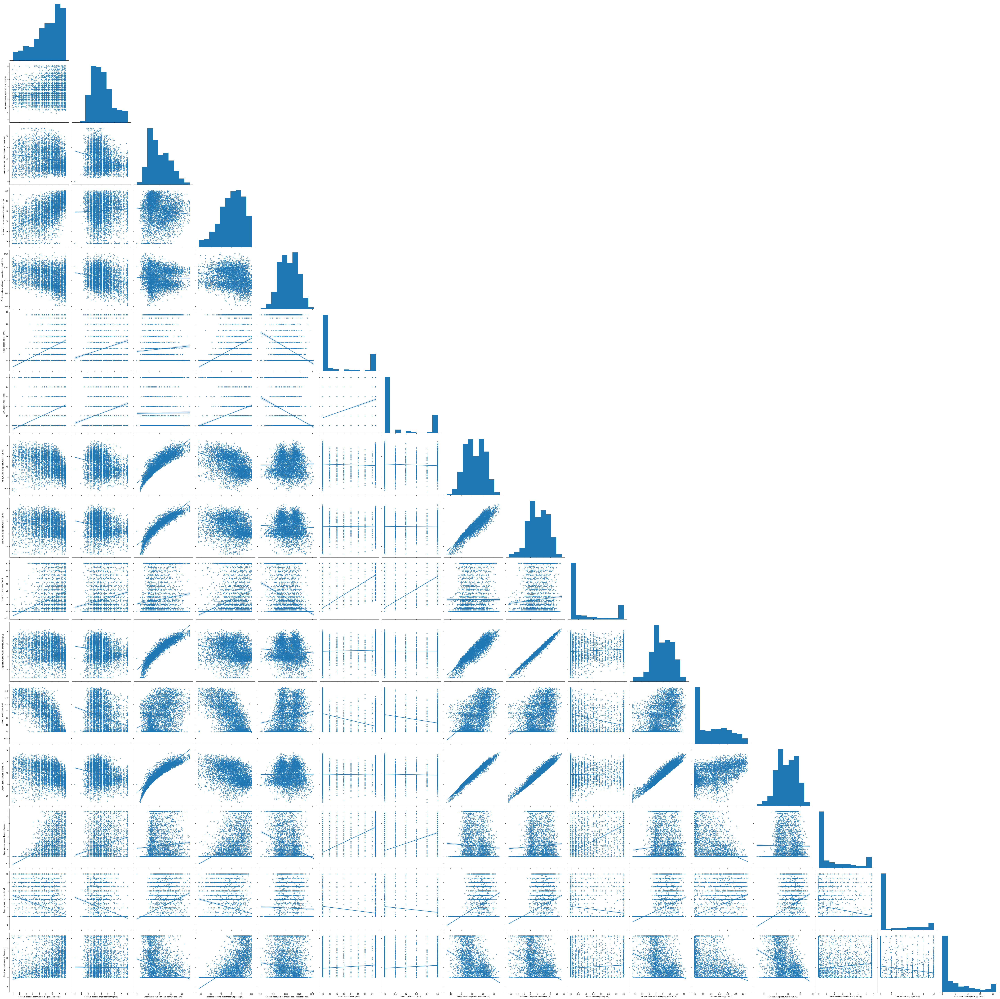

In [45]:
sns.pairplot(dataframe.select_dtypes(include=['float64']), height=5, corner=True, kind="reg", palette="husl", markers="+")

### Po usunięciu danych powtarzających się, możemy stwierdzić że do uczenia na regresji liniowej nadaje się tylko zależność  temperatury od ciśnienia pary wodnej, przy predykcji na dni następnę możliwe jeszcze dodanie temperatury z dnia zeszłego do nauczenia estymatora, a takze kolumn dotyczacych temperatur.

In [46]:
dataframe['month'] = dataframe['data_pomiaru'].dt.month.astype('category')
dataframe['day'] = dataframe['data_pomiaru'].dt.day.astype('category')
dataframe = pd.get_dummies(dataframe)

In [47]:
dataframe.drop(columns = ['data_pomiaru'], inplace = True)

In [48]:
Y_DataSet = dataframe.select_dtypes(include=['float64'])

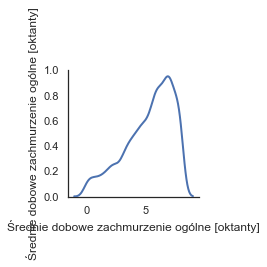

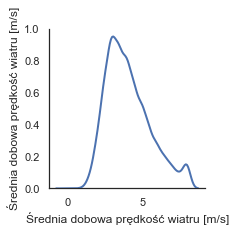

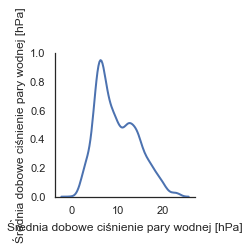

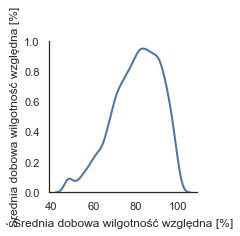

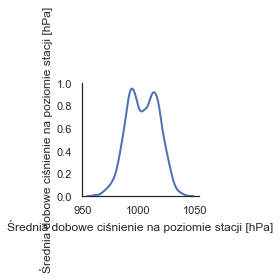

...

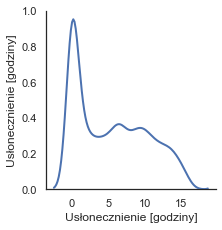

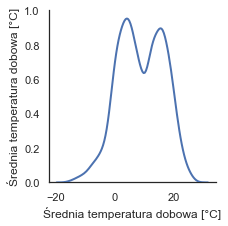

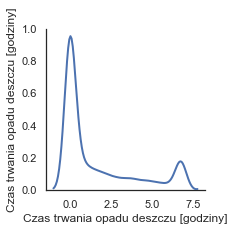

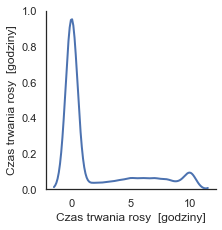

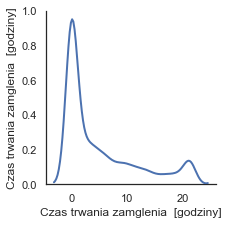

In [49]:
sns.set(style="white")

for column in dataframe.select_dtypes(include=['float64']):
    g = sns.PairGrid(data = pd.DataFrame(data = (Y_DataSet[column].shift(-1)[:-1], dataframe[column][:-1])).T, x_vars = column,\
                             y_vars = column, height = 3)
    g.map_upper(sns.scatterplot)
    g.map_lower(sns.kdeplot, colors="C0")
    g.map_diag(sns.kdeplot, lw=2)

## Zapisywanie datasetu do pliku

In [50]:
dataframe.to_json('dataset')

### Podane grafiki ilustrują że predykcja z "przesunięciem" jest możliwa z użyciem PolymonialFeatures a dla niektórych kolumn w ogóle nie jest możliwa.

In [51]:
filtered = [col for col in dataframe if col.lower()[:4] != 'year']
dataset = dataframe[filtered]

In [52]:
dataset

,Średnie dobowe zachmurzenie ogólne [oktanty],Średnia dobowa prędkość wiatru [m/s],Średnia dobowe ciśnienie pary wodnej [hPa],Średnia dobowa wilgotność względna [%],Średnia dobowe ciśnienie na poziomie stacji [hPa],Suma opadu dzień [mm],Suma opadu noc [mm],Maksymalna temperatura dobowa [°C],Minimalna temperatura dobowa [°C],Suma dobowa opadu [mm],Temperatura minimalna przy gruncie [°C],Usłonecznienie [godziny],Średnia temperatura dobowa [°C],Czas trwania opadu deszczu [godziny],Czas trwania rosy [godziny],Czas trwania zamglenia [godziny],month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,day_1,day_2,day_3,day_4,day_5,day_6,day_7,day_8,day_9,day_10,day_11,day_12,day_13,day_14,day_15,day_16,day_17,day_18,day_19,day_20,day_21,day_22,day_23,day_24,day_25,day_26,day_27,day_28,day_29,day_30,day_31
0,7.4,3.0,7.0,91.1,1007.1,0.60,0.0,4.6,2.8,0.6,2.3,0.6,3.2,6.75,0.0,13.2,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,7.4,3.8,7.6,98.6,1010.8,0.10,0.1,5.1,2.1,0.2,0.3,1.3,3.2,5.70,0.0,7.9,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,7.4,4.5,7.4,90.0,1008.3,0.75,0.5,7.3,2.2,3.5,1.7,0.0,4.2,6.75,0.0,6.9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,7.3,6.1,8.3,97.5,1011.8,0.40,0.5,8.4,1.6,1.2,-0.1,0.0,4.7,5.80,0.0,2.3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,4.3,3.3,7.0,85.5,1009.7,0.00,0.3,7.1,3.0,0.3,1.2,4.6,4.1,0.00,0.0,8.7,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5093,6.8,3.9,5.5,78.3,1035.4,0.00,0.0,3.5,0.6,0.0,-0.1,1.3,1.8,0.70,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5094,6.5,8.0,4.4,65.9,998.5,0.00,0.5,3.1,-0.9,0.6,-0.9,0.0,1.4,2.20,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
5095,6.1,5.1,4.7,60.0,1019.9,0.00,0.0,5.8,0.9,0.0,0.5,0.0,3.7,1.30,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
5096,6.9,6.4,6.3,77.6,993.4,0.20,0.0,5.4,1.9,0.2,0.9,0.8,4.0,2.70,0.0,0.8,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
